In [1]:
import pandas as pd
import numpy as np
import os
import csv
import matplotlib.pyplot as plt
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [2]:
#store file path
hate_crime = "hate_crime/hate_crime.csv"

#import data into panda DF
hate_crime_df = pd.read_csv(hate_crime, low_memory=False)
hate_crime_df.head()

,INCIDENT_ID,DATA_YEAR,ORI,PUB_AGENCY_NAME,PUB_AGENCY_UNIT,AGENCY_TYPE_NAME,STATE_ABBR,STATE_NAME,DIVISION_NAME,REGION_NAME,POPULATION_GROUP_CODE,POPULATION_GROUP_DESC,INCIDENT_DATE,ADULT_VICTIM_COUNT,JUVENILE_VICTIM_COUNT,TOTAL_OFFENDER_COUNT,ADULT_OFFENDER_COUNT,JUVENILE_OFFENDER_COUNT,OFFENDER_RACE,OFFENDER_ETHNICITY,VICTIM_COUNT,OFFENSE_NAME,TOTAL_INDIVIDUAL_VICTIMS,LOCATION_NAME,BIAS_DESC,VICTIM_TYPES,MULTIPLE_OFFENSE,MULTIPLE_BIAS
0,3015,1991,AR0040200,Rogers,NaN,City,AR,Arkansas,West South Central,South,5,"Cities from 10,000 thru 24,999",31-AUG-91,NaN,NaN,1,NaN,NaN,White,NaN,1,Intimidation,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-Black or African American,Individual,S,S
1,3016,1991,AR0290100,Hope,NaN,City,AR,Arkansas,West South Central,South,6,"Cities from 2,500 thru 9,999",19-SEP-91,NaN,NaN,1,NaN,NaN,Black or African American,NaN,1,Simple Assault,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,S,S
2,43,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,West South Central,South,3,"Cities from 50,000 thru 99,999",04-JUL-91,NaN,NaN,1,NaN,NaN,Black or African American,NaN,1,Aggravated Assault,1.0,Residence/Home,Anti-Black or African American,Individual,S,S
3,44,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,West South Central,South,3,"Cities from 50,000 thru 99,999",24-DEC-91,NaN,NaN,1,NaN,NaN,Black or African American,NaN,2,Aggravated Assault;Destruction/Damage/Vandalism of Property,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,M,S
4,3017,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,West South Central,South,3,"Cities from 50,000 thru 99,999",23-DEC-91,NaN,NaN,1,NaN,NaN,Black or African American,NaN,1,Aggravated Assault,1.0,Service/Gas Station,Anti-White,Individual,S,S


In [3]:
#only data from last four years
#filter out data from columns you want to use
filtered_df = hate_crime_df[["DATA_YEAR", "OFFENSE_NAME"]]
filtered_df.head()

,DATA_YEAR,OFFENSE_NAME
0,1991,Intimidation
1,1991,Simple Assault
2,1991,Aggravated Assault
3,1991,Aggravated Assault;Destruction/Damage/Vandalism of Property
4,1991,Aggravated Assault


In [4]:
#finding name of the offense name

filtered_df["OFFENSE_NAME"].unique()

array(['Intimidation', 'Simple Assault', 'Aggravated Assault',
       'Aggravated Assault;Destruction/Damage/Vandalism of Property',
       'Robbery',
       'Aggravated Assault;Murder and Nonnegligent Manslaughter',
       'Destruction/Damage/Vandalism of Property',
       'Destruction/Damage/Vandalism of Property;Intimidation',
       'Aggravated Assault;Intimidation',
       'Aggravated Assault;Not Specified', 'Intimidation;Simple Assault',
       'Arson',
       'Destruction/Damage/Vandalism of Property;Intimidation;Simple Assault',
       'Burglary/Breaking & Entering;Destruction/Damage/Vandalism of Property;Not Specified',
       'Murder and Nonnegligent Manslaughter',
       'Intimidation;Not Specified',
       'Destruction/Damage/Vandalism of Property;Not Specified',
       'Burglary/Breaking & Entering',
       'Destruction/Damage/Vandalism of Property;Simple Assault',
       'Not Specified', 'Rape', 'Aggravated Assault;Arson',
       'Destruction/Damage/Vandalism of Property;

In [5]:
#get numbers of offenses 

hate_crime_df["OFFENSE_NAME"].value_counts()

Destruction/Damage/Vandalism of Property                                                                                        62147
Intimidation                                                                                                                    58751
Simple Assault                                                                                                                  38042
Aggravated Assault                                                                                                              20999
Robbery                                                                                                                          3454
Burglary/Breaking & Entering                                                                                                     2670
Destruction/Damage/Vandalism of Property;Intimidation                                                                            1774
All Other Larceny                                             

In [6]:
#combine similiar offenses together
hate_crime_similar_df = filtered_df.replace(
{"Aggravated Assault;All Other": "Aggravated Assault", "Intimidation;Simple Assault": "Simple Assault"})
hate_crime_similar_df.head()

,DATA_YEAR,OFFENSE_NAME
0,1991,Intimidation
1,1991,Simple Assault
2,1991,Aggravated Assault
3,1991,Aggravated Assault;Destruction/Damage/Vandalism of Property
4,1991,Aggravated Assault


In [7]:
#verify grouping together worked
hate_crime_similar_df["OFFENSE_NAME"].value_counts()

Destruction/Damage/Vandalism of Property                                                                                        62147
Intimidation                                                                                                                    58751
Simple Assault                                                                                                                  38911
Aggravated Assault                                                                                                              20999
Robbery                                                                                                                          3454
Burglary/Breaking & Entering                                                                                                     2670
Destruction/Damage/Vandalism of Property;Intimidation                                                                            1774
All Other Larceny                                             

In [8]:
grouped_df = filtered_df.groupby(['OFFENSE_NAME'])
grouped_df.count().head()


,DATA_YEAR
OFFENSE_NAME,
Aggravated Assault,20999
Aggravated Assault;All Other Larceny,14
Aggravated Assault;All Other Larceny;Burglary/Breaking & Entering;Destruction/Damage/Vandalism of Property,1
Aggravated Assault;All Other Larceny;Destruction/Damage/Vandalism of Property,1
Aggravated Assault;All Other Larceny;Kidnapping/Abduction,1


In [9]:
crime_count = grouped_df["OFFENSE_NAME"].count()
year_count = grouped_df["DATA_YEAR"].count()

In [10]:
years_df = filtered_df[(filtered_df["DATA_YEAR"] >= 2014) & (filtered_df["DATA_YEAR"] <= 2018)]
years_df.head()

,DATA_YEAR,OFFENSE_NAME
169146,2014,Destruction/Damage/Vandalism of Property
169147,2014,Aggravated Assault
169148,2014,Simple Assault
169149,2014,Robbery
169150,2014,Simple Assault


In [11]:
#get top 10 crimes as the most crimes
#create new DataFrame that shows top ten crimes
offense_name_summary_df = pd.DataFrame({"Offense Count": crime_count})
offense_name_summary_df.sort_values(by=["Offense Count"],ascending=False)


,Offense Count
OFFENSE_NAME,
Destruction/Damage/Vandalism of Property,62147
Intimidation,58751
Simple Assault,38042
Aggravated Assault,20999
Robbery,3454
Burglary/Breaking & Entering,2670
Destruction/Damage/Vandalism of Property;Intimidation,1774
All Other Larceny,1616
Arson,1091


In [12]:
#merge data frames
merged_dataset = pd.merge(offense_name_summary_df, years_df, on = "OFFENSE_NAME")
merged_dataset.sort_values(by=["Offense Count"], ascending=False)

,OFFENSE_NAME,Offense Count,DATA_YEAR
11961,Destruction/Damage/Vandalism of Property,62147,2017
9507,Destruction/Damage/Vandalism of Property,62147,2016
9496,Destruction/Damage/Vandalism of Property,62147,2016
9497,Destruction/Damage/Vandalism of Property,62147,2016
9498,Destruction/Damage/Vandalism of Property,62147,2016
9499,Destruction/Damage/Vandalism of Property,62147,2016
9500,Destruction/Damage/Vandalism of Property,62147,2016
9501,Destruction/Damage/Vandalism of Property,62147,2016
9502,Destruction/Damage/Vandalism of Property,62147,2016
9503,Destruction/Damage/Vandalism of Property,62147,2016


In [13]:
# year by year breakdown
offensename14_df = years_df.loc[years_df["DATA_YEAR"] == 2014,:]["OFFENSE_NAME"].value_counts()[:10]
offensename14_df.head(10)

Destruction/Damage/Vandalism of Property    1647
Intimidation                                1321
Simple Assault                              1257
Aggravated Assault                           551
Burglary/Breaking & Entering                 140
Robbery                                      111
All Other Larceny                            105
Theft From Building                           34
Theft From Motor Vehicle                      33
Shoplifting                                   32
Name: OFFENSE_NAME, dtype: int64

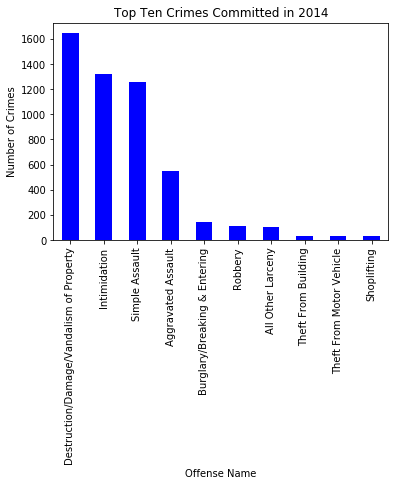

In [14]:
#generate a bar plot showing only ten of the most crimes in 2014
year14 = offensename14_df.plot(kind="bar", facecolor = "blue")
year14.set_xlabel("Offense Name")
year14.set_ylabel("Number of Crimes")
year14.set_title("Top Ten Crimes Committed in 2014")



plt.show()

In [15]:
offensename15_df = years_df.loc[years_df["DATA_YEAR"] == 2015,:]["OFFENSE_NAME"].value_counts()[:10]
offensename15_df.head(10)

Destruction/Damage/Vandalism of Property    1620
Intimidation                                1432
Simple Assault                              1381
Aggravated Assault                           625
Burglary/Breaking & Entering                 123
Robbery                                      113
All Other Larceny                            100
Shoplifting                                   42
Theft From Motor Vehicle                      31
Not Specified                                 29
Name: OFFENSE_NAME, dtype: int64

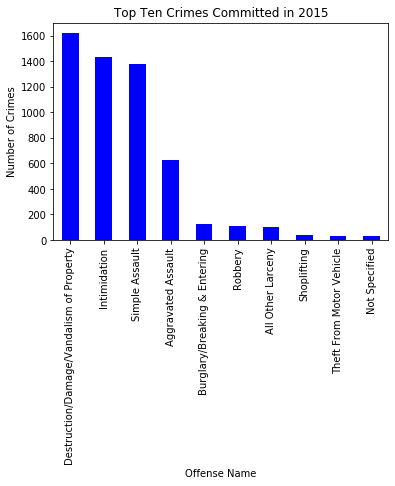

In [16]:
#generate a bar plot showing only ten of the most crimes in 2015
year15 = offensename15_df.plot(kind="bar", facecolor = "blue")
year15.set_xlabel("Offense Name")
year15.set_ylabel("Number of Crimes")
year15.set_title("Top Ten Crimes Committed in 2015")

plt.show()

In [17]:
offensename16_df = years_df.loc[years_df["DATA_YEAR"] == 2016,:]["OFFENSE_NAME"].value_counts()[:10]
offensename16_df.head(10)

Destruction/Damage/Vandalism of Property                 1812
Intimidation                                             1528
Simple Assault                                           1413
Aggravated Assault                                        628
Robbery                                                   114
Burglary/Breaking & Entering                               94
All Other Larceny                                          75
Drug/Narcotic Violations                                   43
Destruction/Damage/Vandalism of Property;Intimidation      42
Shoplifting                                                41
Name: OFFENSE_NAME, dtype: int64

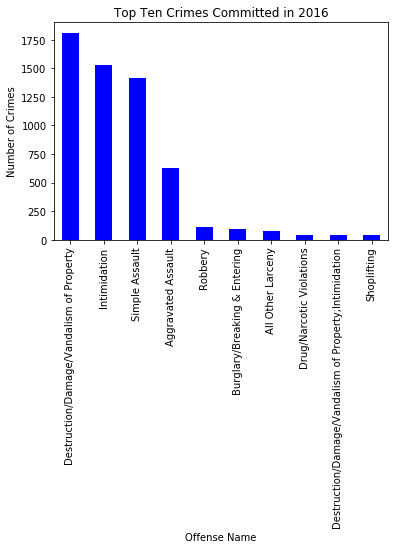

In [18]:
#generate a bar plot showing only ten of the most crimes in 2016
year16 = offensename16_df.plot(kind="bar", facecolor = "blue")
year16.set_xlabel("Offense Name")
year16.set_ylabel("Number of Crimes")
year16.set_title("Top Ten Crimes Committed in 2016")

plt.show()

In [19]:
offensename17_df = years_df.loc[years_df["DATA_YEAR"] == 2017,:]["OFFENSE_NAME"].value_counts()[:10]
offensename17_df.head(10)

Destruction/Damage/Vandalism of Property    2223
Intimidation                                1754
Simple Assault                              1377
Aggravated Assault                           738
Robbery                                      141
All Other Larceny                            136
Drug/Narcotic Violations                     126
Burglary/Breaking & Entering                 117
Shoplifting                                   59
Theft From Motor Vehicle                      48
Name: OFFENSE_NAME, dtype: int64

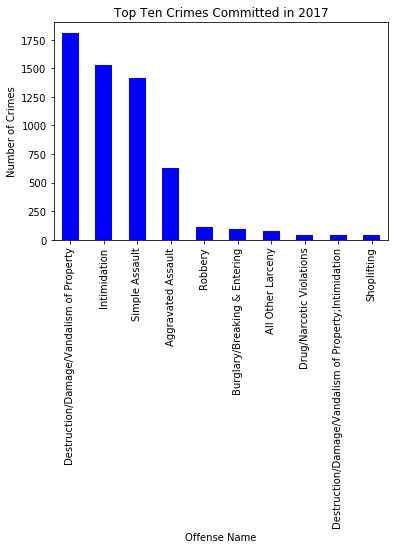

In [20]:
#generate a bar plot showing only ten of the most crimes in 2017
year17 = offensename16_df.plot(kind="bar", facecolor = "blue")
year17.set_xlabel("Offense Name")
year17.set_ylabel("Number of Crimes")
year17.set_title("Top Ten Crimes Committed in 2017")

plt.show()

In [21]:
offensename18_df = years_df.loc[years_df["DATA_YEAR"] == 2018,:]["OFFENSE_NAME"].value_counts()[:10]
offensename18_df.head(10)

Intimidation                                             1887
Destruction/Damage/Vandalism of Property                 1723
Simple Assault                                           1547
Aggravated Assault                                        736
Drug/Narcotic Violations                                  138
All Other Larceny                                         130
Robbery                                                   118
Burglary/Breaking & Entering                               96
Destruction/Damage/Vandalism of Property;Intimidation      66
Drug Equipment Violations                                  52
Name: OFFENSE_NAME, dtype: int64

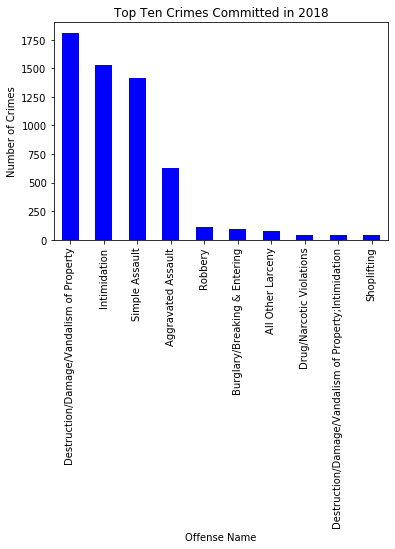

In [22]:
#generate a bar plot showing only ten of the most crimes in 2018
year18 = offensename16_df.plot(kind="bar", facecolor = "blue")
year18.set_xlabel("Offense Name")
year18.set_ylabel("Number of Crimes")
year18.set_title("Top Ten Crimes Committed in 2018")

plt.show()